In [1]:
import anndata as ad
import pandas as pd
import scanpy as sc
from pathlib import Path
import os
import sklearn
import scipy
import numpy as np
import sceleto2 as scl
import pickle
import glob
import os
import scrublet as scr
import matplotlib.pyplot as plt


sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, dpi_save=300, figsize=(5,5))
sc.settings.figdir = "./figures"
sc.settings.autosave = False
random_seed = 0

from datetime import date
TODAY = date.today()
print(TODAY)

/home/lsj1022/anaconda3/envs/scenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2026-09-13


In [2]:
dataset = 'thrupp'

# 1. QC

In [5]:
#adata = sc.read_h5ad("/home/neuro_demo_research/repo/epilepsy_microglia_repo/notebooks/epilepsy_microglia/data/processed/galvao/galvao.h5ad")
adata = sc.read_h5ad(f"/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/{dataset}/{dataset}.h5ad")
adata

AnnData object with n_obs × n_vars = 37060 × 29439
    obs: 'GSM', 'study_id', 'dataset_id', 'species', 'disease_status', 'diagnosis_raw', 'diagnosis_harmonized', 'fcd_class', 'fcd_subtype', 'mtoropathy_status', 'driver_mutation_status', 'driver_gene', 'driver_variant', 'mutation_scope', 'brain_region_raw', 'brain_region', 'lesion_position', 'control_type', 'epilepsy_duration_years', 'sample_source', 'tissue_state', 'cell_or_nucleus', 'platform', 'chemistry', 'raw_counts_available', 'cell_metadata_available', 'genetic_metadata_available', 'processed_file_format', 'geo_downloadable', 'source_url', 'sample_id', 'donor_id', 'donor_id_global', 'age_years', 'sex', 'main_analysis_eligible', 'exclusion_reason'

In [6]:
adata.var

""
A1BG
A1BG-AS1
A1CF
A2M
A2M-AS1
...
ZYX
ZZEF1
ZZZ3
bP-21264C1.2


In [7]:
adata.obs['sample_id'].value_counts()

sample_id
RM102_snRNA_rep1    6539
RM77_snRNA_rep1     5986
RM102_snRNA_rep2    5744
RM101_snRNA_rep2    5491
RM95_snRNA_rep2     4911
RM77_snRNA_rep2     4896
RM95_snRNA_rep1     3493
Name: count, dtype: int64

In [8]:
adata.obs['donor_id'].value_counts()

donor_id
RM102    12283
RM77     10882
RM95      8404
RM101     5491
Name: count, dtype: int64

In [9]:
adata.var_names_make_unique()

adata.var["mt"] = adata.var_names.str.upper().str.startswith("MT-")
adata.var["ribo"] = adata.var_names.str.upper().str.startswith(("RPS", "RPL"))
adata.var["hb"] = adata.var_names.str.upper().str.startswith(
    ("HBA", "HBB", "HBD", "HBE", "HBG", "HBM", "HBQ", "HBZ")
)

sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt", "ribo", "hb"],
    inplace=True,
    percent_top=[20],
    log1p=True,
)

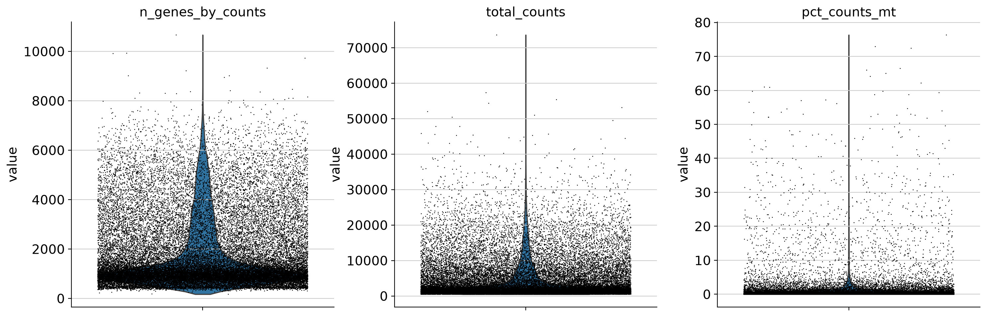

In [10]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

,sample_id,donor_id,total_counts,n_genes_by_counts
Nuc-RM101-2_AAACCTGAGTCATCCA-1-GSM4654467,RM101_snRNA_rep2,RM101,1919.0,1046
Nuc-RM101-2_AAACCTGCAATACGCT-1-GSM4654467,RM101_snRNA_rep2,RM101,4253.0,1955
Nuc-RM101-2_AAACCTGCACGAGGTA-1-GSM4654467,RM101_snRNA_rep2,RM101,2146.0,1280
Nuc-RM101-2_AAACCTGCAGATGAGC-1-GSM4654467,RM101_snRNA_rep2,RM101,1752.0,1086
Nuc-RM101-2_AAACCTGCATAAGACA-1-GSM4654467,RM101_snRNA_rep2,RM101,1781.0,1030


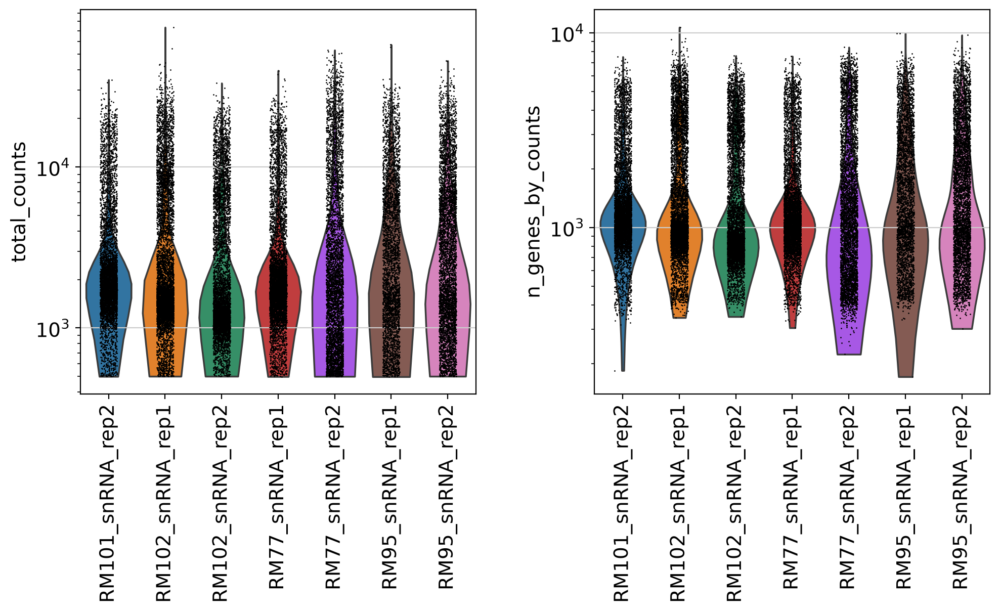

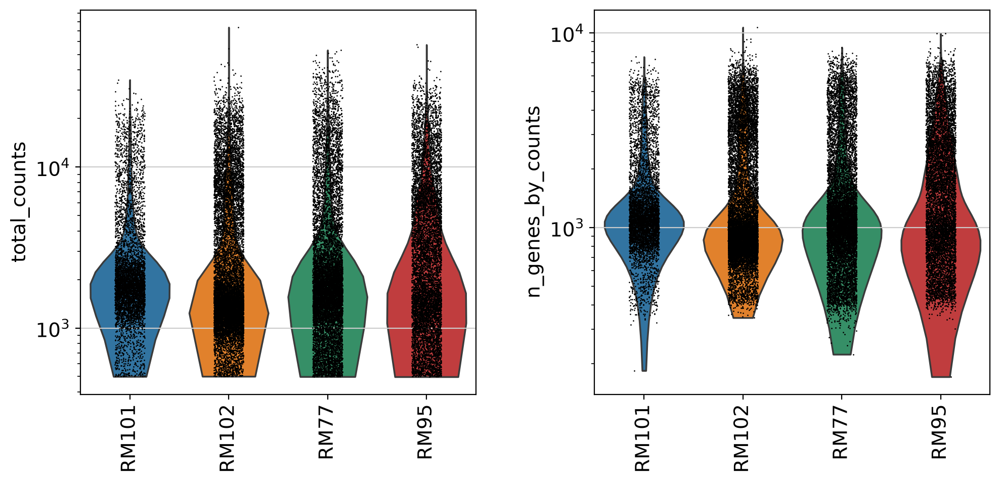

In [11]:
# check donor/sample-level qc metrics

import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# Use the raw-count layer if present; otherwise use adata.X.
count_layer = "counts" if "counts" in adata.layers else None

sc.pp.calculate_qc_metrics(
    adata,
    layer=count_layer,
    inplace=True,
    log1p=False,
)

# Confirm these exist before plotting.
display(
    adata.obs[
        ["sample_id", "donor_id", "total_counts", "n_genes_by_counts"]
    ].head()
)

for groupby in ["sample_id", "donor_id"]:
    if groupby not in adata.obs.columns:
        print(f"Skipping {groupby}: column not found.")
        continue

    sc.pl.violin(
        adata,
        keys=["total_counts", "n_genes_by_counts"],
        groupby=groupby,
        layer=count_layer,
        log=True,          # easier to see the low-count nuclear tail
        jitter=0.15,
        rotation=90,
        multi_panel=True,
        show=True,
    )

In [13]:
cutoffs = pd.DataFrame(
    {
        "counts≥500": adata.obs["total_counts"] >= 500,
        "counts≥1000": adata.obs["total_counts"] >= 1000,
        "counts≥2000": adata.obs["total_counts"] >= 2000,
        "genes≥300": adata.obs["n_genes_by_counts"] >= 250,
        "genes≥500": adata.obs["n_genes_by_counts"] >= 500,
    },
    index=adata.obs_names,
)

retention_by_sample = (
    cutoffs
    .join(adata.obs["sample_id"])
    .groupby("sample_id", observed=True)
    .mean()
    .mul(100)
    .round(1)
)

display(retention_by_sample)

,counts≥500,counts≥1000,counts≥2000,genes≥300,genes≥500
sample_id,,,,,
RM101_snRNA_rep2,100.0,93.6,45.9,100.0,97.0
RM102_snRNA_rep1,100.0,90.8,44.1,100.0,96.0
RM102_snRNA_rep2,100.0,82.9,38.0,100.0,96.9
RM77_snRNA_rep1,100.0,91.6,42.1,100.0,96.8
RM77_snRNA_rep2,100.0,70.4,47.8,100.0,86.1
RM95_snRNA_rep1,100.0,81.9,56.3,100.0,93.0
RM95_snRNA_rep2,100.0,81.9,56.0,100.0,93.8


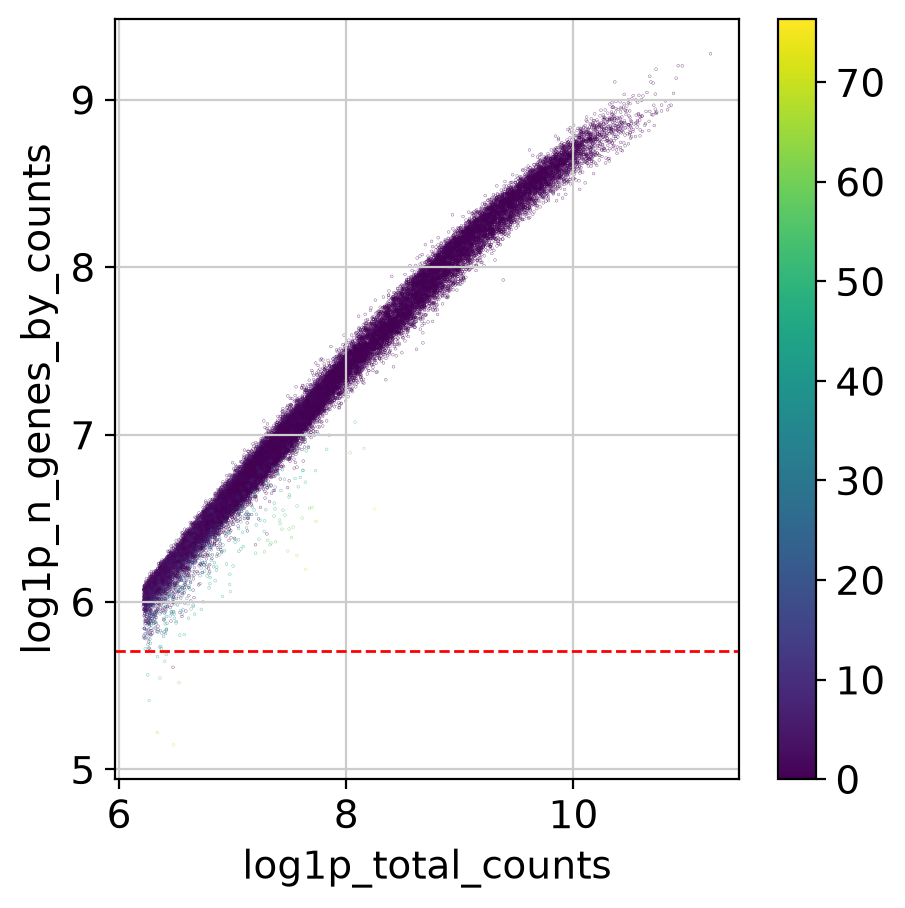

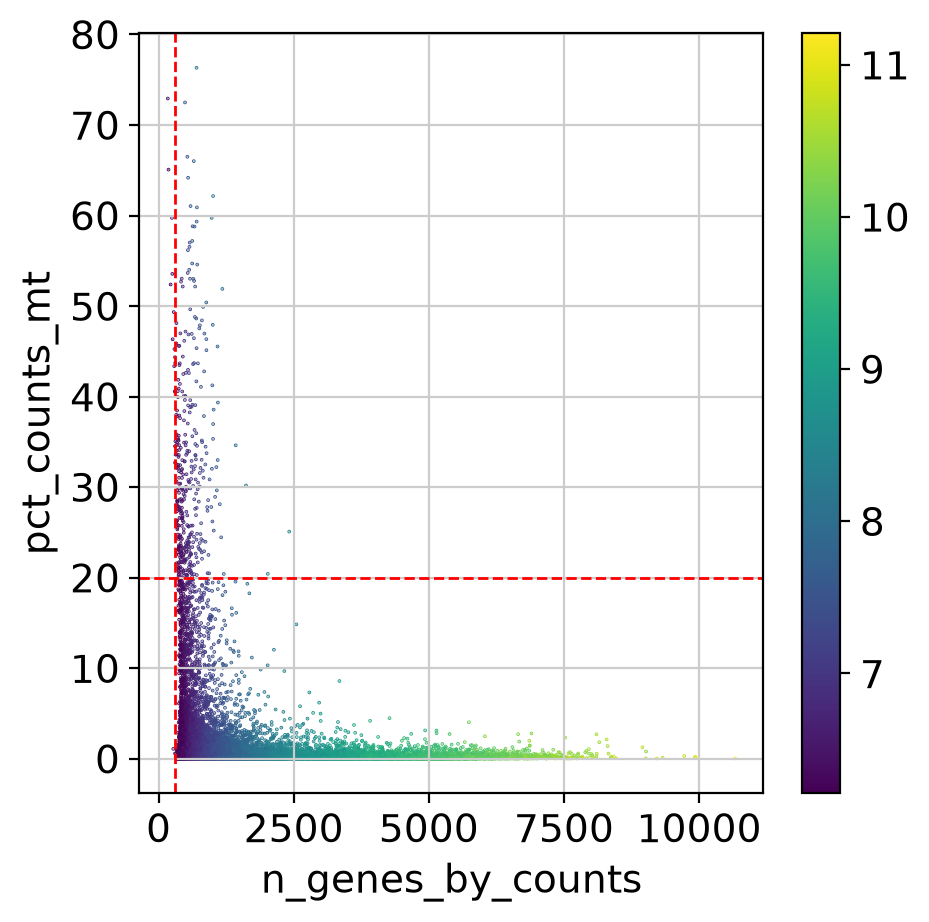

In [14]:
plt.scatter(adata.obs['log1p_total_counts'], adata.obs['log1p_n_genes_by_counts'], c=adata.obs['pct_counts_mt'], s=0.01)
#plt.axvline(x=np.log1p(750), color='r', linestyle='--', linewidth=1) # min_counts
plt.axhline(y=np.log1p(300), color='r', linestyle='--', linewidth=1) # min_genes
#plt.axhline(y=np.log1p(7000), color='r', linestyle='--', linewidth=1) # max_genes
plt.xlabel('log1p_total_counts')
plt.ylabel('log1p_n_genes_by_counts')
plt.colorbar()
plt.show()

plt.scatter(adata.obs['n_genes_by_counts'], adata.obs['pct_counts_mt'], c=adata.obs['log1p_total_counts'], s=0.1)
plt.axvline(x=300, color='r', linestyle='--', linewidth=1) # min_genes
#plt.axvline(x=7000, color='r', linestyle='--', linewidth=1) # max_genes
plt.axhline(y=20, color='r', linestyle='--', linewidth=1) # max_mt
plt.xlabel('n_genes_by_counts')
plt.ylabel('pct_counts_mt')
plt.colorbar()
plt.show()

In [15]:
# doublet detection

scrub = scr.Scrublet(adata.X)
scores, predicted = scrub.scrub_doublets(verbose=False)

adata.obs["doublet_scores"] = scores
adata.obs["predicted_doublets"] = predicted

print(adata.obs["predicted_doublets"].value_counts())

predicted_doublets
False    36481
True       579
Name: count, dtype: int64


In [16]:
#sc.pp.filter_cells(adata, min_counts=500) 
#sc.pp.filter_cells(adata, min_genes=300)
#sc.pp.filter_cells(adata, max_genes=7000) 
adata = adata[adata.obs['pct_counts_mt'] < 20, :] # 20% 이상의 mitochondria 분율을 가진 Sample 제외 (doublet 일 수 있음)

In [17]:
adata = adata[~adata.obs["predicted_doublets"]].copy()

In [18]:
adata

AnnData object with n_obs × n_vars = 36088 × 29439
    obs: 'GSM', 'study_id', 'dataset_id', 'species', 'disease_status', 'diagnosis_raw', 'diagnosis_harmonized', 'fcd_class', 'fcd_subtype', 'mtoropathy_status', 'driver_mutation_status', 'driver_gene', 'driver_variant', 'mutation_scope', 'brain_region_raw', 'brain_region', 'lesion_position', 'control_type', 'epilepsy_duration_years', 'sample_source', 'tissue_state', 'cell_or_nucleus', 'platform', 'chemistry', 'raw_counts_available', 'cell_metadata_available', 'genetic_metadata_available', 'processed_file_format', 'geo_downloadable', 'source_url', 'sample_id', 'donor_id', 'donor_id_global', 'age_years', 'sex', 'main_analysis_eligible', 'exclusion_reason', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb'

In [19]:
adata.write(f"/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/{dataset}/{dataset}_qc.h5ad")

# 2. Preprocess

In [20]:
adata.layers['counts'] = adata.X.copy()

In [21]:
print(adata.layers['counts'].max())
print(adata.layers['counts'].min())

7638.0
0.0


In [22]:
# normalization

print('before log1p norm')
print('max: ', np.max(adata.X))
print('min: ', np.min(adata.X))
print('mean: ', np.mean(adata.X))

adata.var_names_make_unique()
adata.obs_names_make_unique()

# Normalization : Sample 에서 세포 합이 모두 100,00 이 되도록 함 (Sample 간의 비교를 위해)
sc.pp.normalize_total(adata, target_sum=1e4)

# Matrix 가 잘 정규화 되었는지 확인
adata.X.sum(axis=1)

# Logarithmize
sc.pp.log1p(adata)
adata.raw = adata
print('after log1p norm')
print('max: ', np.max(adata.X))
print('min: ', np.min(adata.X))
print('mean: ', np.mean(adata.X))

before log1p norm
max:  7638.0
min:  0.0
mean:  0.14696032
normalizing counts per cell
    finished (0:00:00)
after log1p norm
max:  8.363726
min:  0.0
mean:  0.08712348


extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


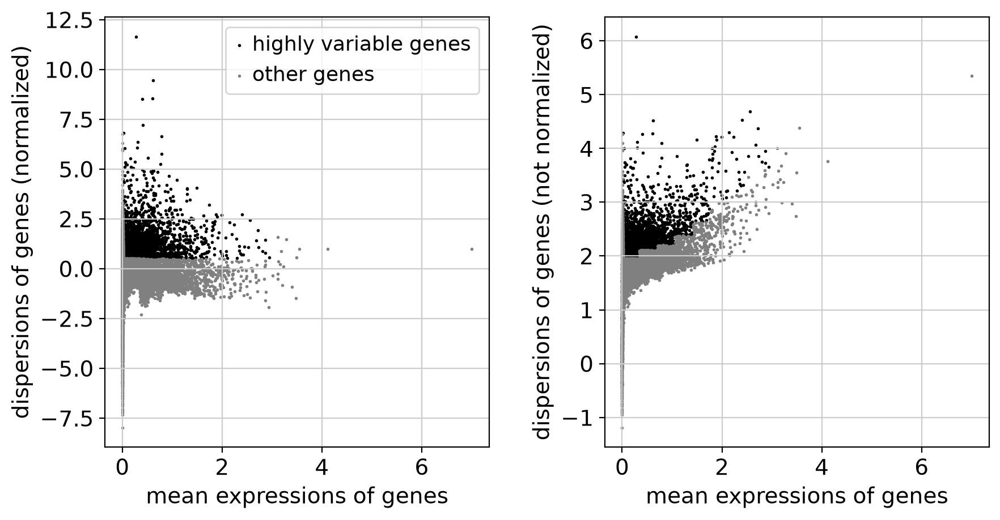

detected 5747 highly variable genes


In [23]:
# HVG (Highly variable genes) : adata 에서 어떤 Gene 들이 많이 차이가 나는지 확인
sc.pp.highly_variable_genes(adata) # adata 에서 HVG 에 해당하는 Gene 갯수를 확인
sc.pl.highly_variable_genes(adata)
print(f"detected {np.sum(adata.var['highly_variable'])} highly variable genes")

sc.pp.scale(adata, max_value=10)

In [ ]:
adata.write(f"/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/{dataset}/{dataset}_qc.h5ad")

# 3. Feature Selecetion

computing PCA
    with n_comps=50
    finished (0:00:07)


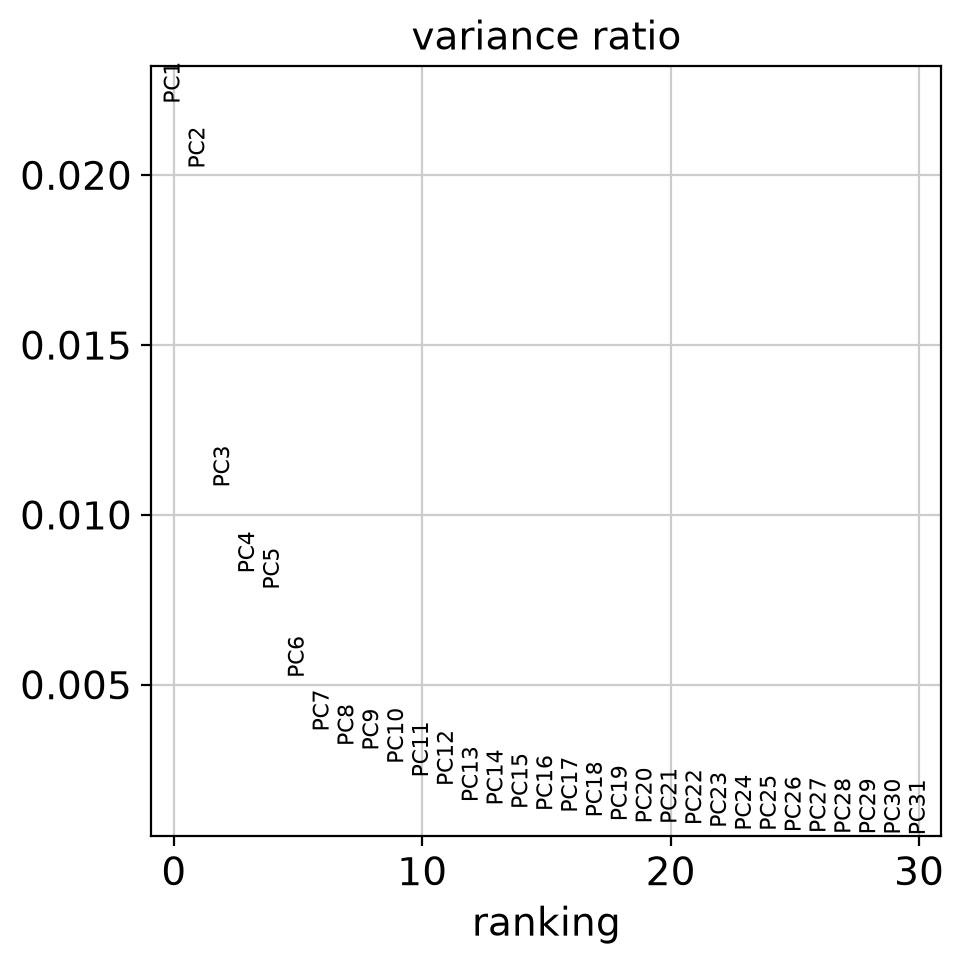

In [24]:
sc.tl.pca(adata)
sc.pl.pca_variance_ratio(adata)

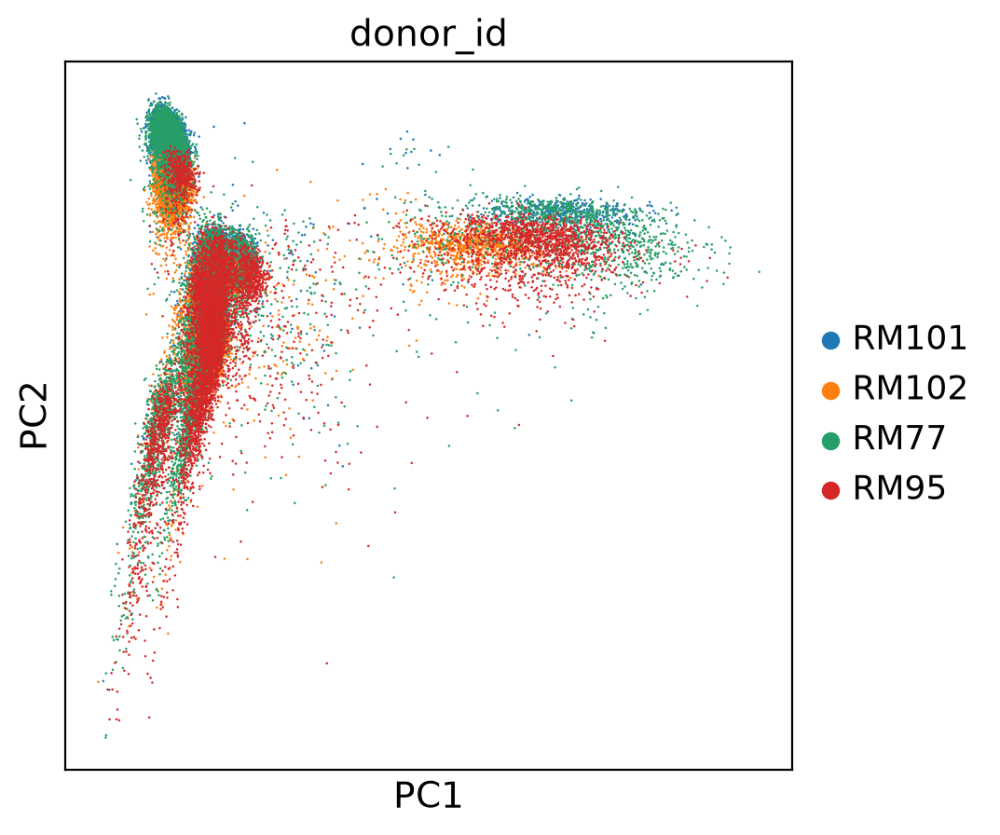

In [25]:
sc.pl.pca(adata, color = 'donor_id')

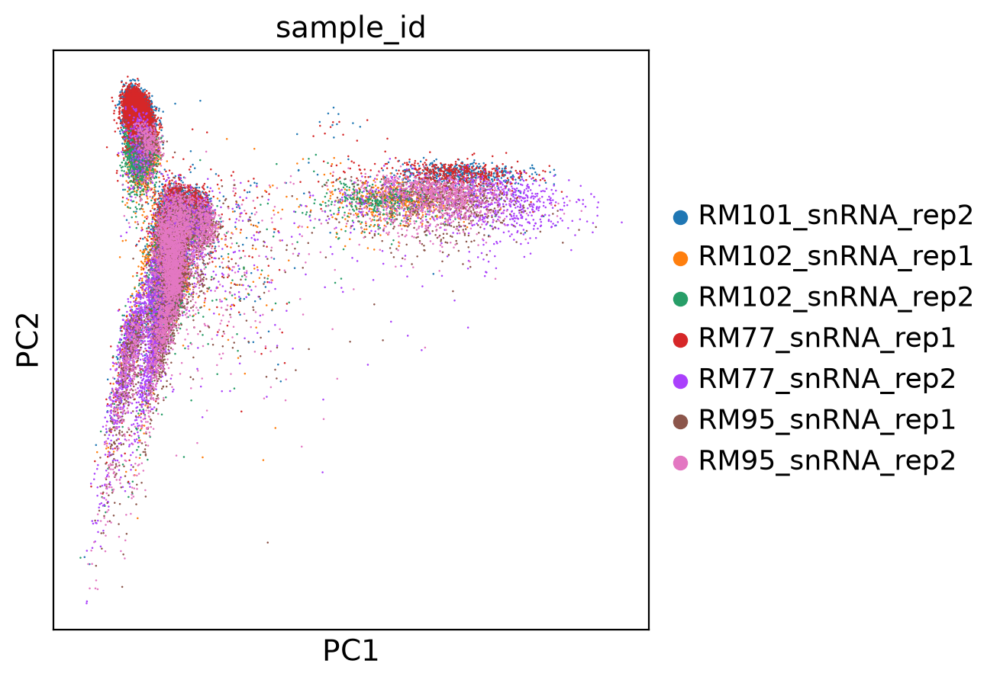

In [26]:
sc.pl.pca(adata, color = 'sample_id')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:28)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:18)


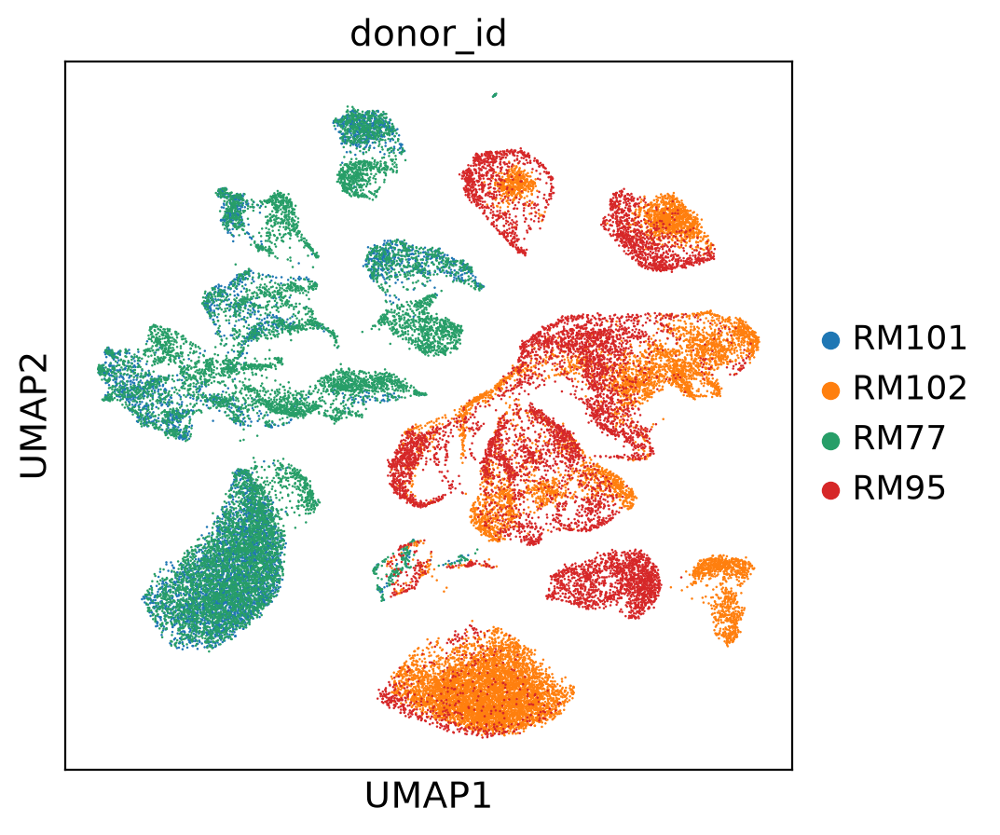

In [27]:
# without batch correction

sc.pp.neighbors(adata, use_rep = 'X_pca', n_pcs = 20)
sc.tl.umap(adata)
sc.pl.umap(adata, color = 'donor_id', save=f"_{TODAY}_{dataset}_donor_xharmony_npcs=20.png")

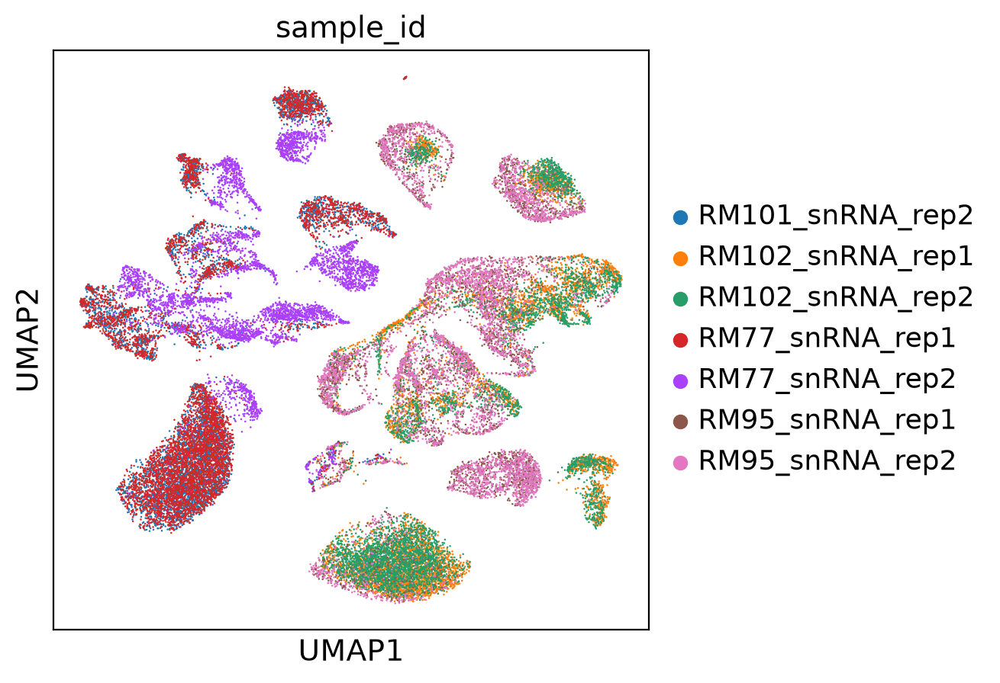

In [28]:
sc.pl.umap(adata, color = 'sample_id', save=f"_{TODAY}_{dataset}_sample_xharmony_npcs=20.png")

In [29]:
import harmonypy as hm

ho = hm.run_harmony(
    adata.obsm["X_pca"].astype(np.float64),
    adata.obs,
    "sample_id",
    max_iter_harmony=50
)

print(ho.Z_corr.shape)
adata.obsm["X_pca_harmony"] = np.asarray(ho.Z_corr)

2026-09-13 01:49:00,677 - harmonypy - INFO - Running Harmony
2026-09-13 01:49:00,678 - harmonypy - INFO -   Parameters:
2026-09-13 01:49:00,679 - harmonypy - INFO -     max_iter_harmony: 50
2026-09-13 01:49:00,679 - harmonypy - INFO -     max_iter_kmeans: 4
2026-09-13 01:49:00,680 - harmonypy - INFO -     epsilon_cluster: 0.001
2026-09-13 01:49:00,681 - harmonypy - INFO -     epsilon_harmony: 0.01
2026-09-13 01:49:00,681 - harmonypy - INFO -     nclust: 100
2026-09-13 01:49:00,682 - harmonypy - INFO -     block_size: 0.05
2026-09-13 01:49:00,683 - harmonypy - INFO -     lamb: dynamic (alpha=0.2)
2026-09-13 01:49:00,683 - harmonypy - INFO -     theta: [2. 2. 2. 2. 2. 2. 2.]
2026-09-13 01:49:00,684 - harmonypy - INFO -     sigma: [0.1 0.1 0.1 0.1 0.1]...
2026-09-13 01:49:00,685 - harmonypy - INFO -     verbose: True
2026-09-13 01:49:00,685 - harmonypy - INFO -     random_state: 0
2026-09-13 01:49:00,686 - harmonypy - INFO -   Data: 50 PCs × 36088 cells
2026-09-13 01:49:00,687 - harmonypy

(36088, 50)


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:16)


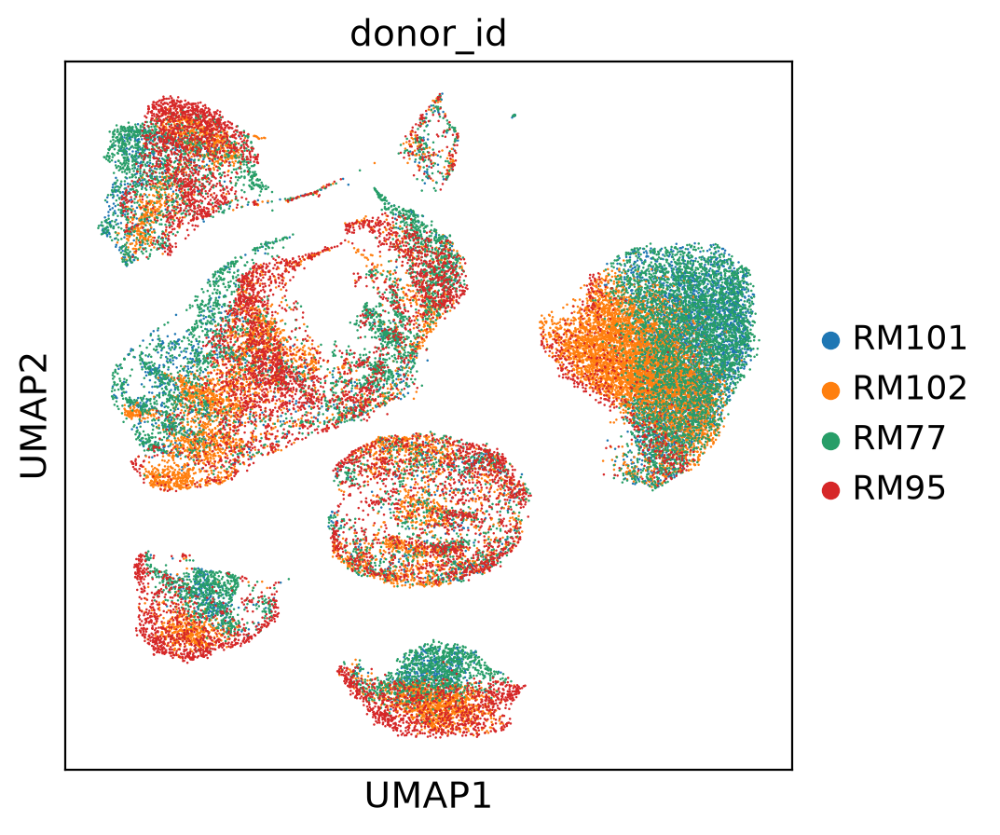

In [30]:
# with batch correction

sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_pcs = 20)
sc.tl.umap(adata)
sc.pl.umap(adata, color = 'donor_id', save=f"_{TODAY}_{dataset}_donor_harmony_npcs=20.png")

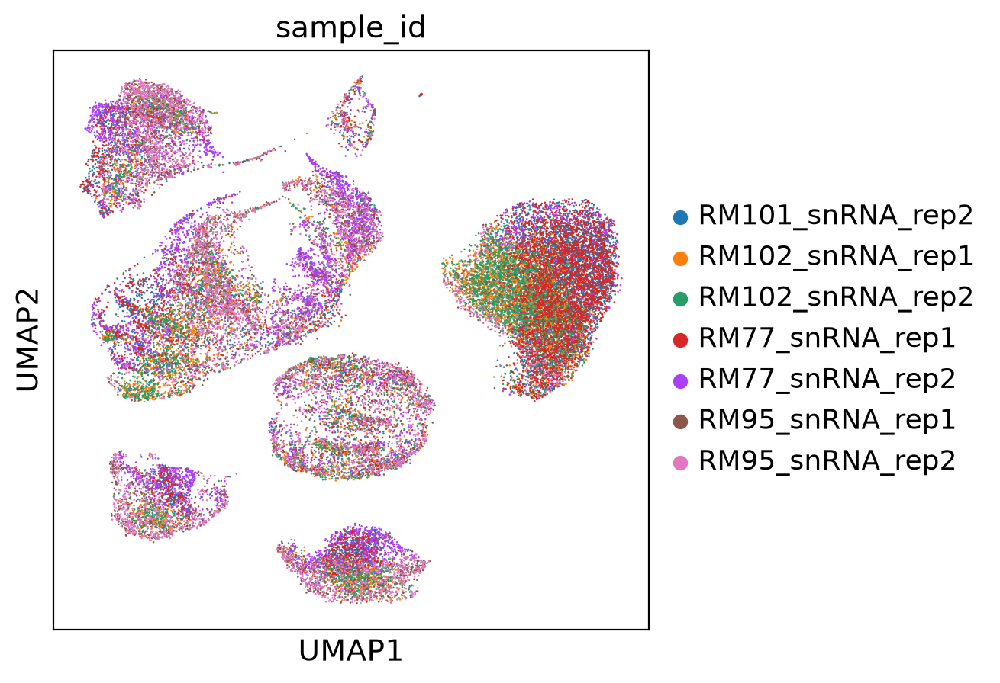

In [31]:
sc.pl.umap(adata, color = 'sample_id', save=f"_{TODAY}_{dataset}_sample_harmony_npcs=20.png")

# 4. Clustering

In [32]:
sc.tl.leiden(adata, resolution = 0.5, key_added='leiden_05')
sc.tl.leiden(adata, resolution = 1.0, key_added='leiden_10')

running Leiden clustering


/tmp/ipykernel_3425493/4008177221.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution = 0.5, key_added='leiden_05')


    finished: found 13 clusters and added
    'leiden_05', the cluster labels (adata.obs, categorical) (0:00:14)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden_10', the cluster labels (adata.obs, categorical) (0:00:33)


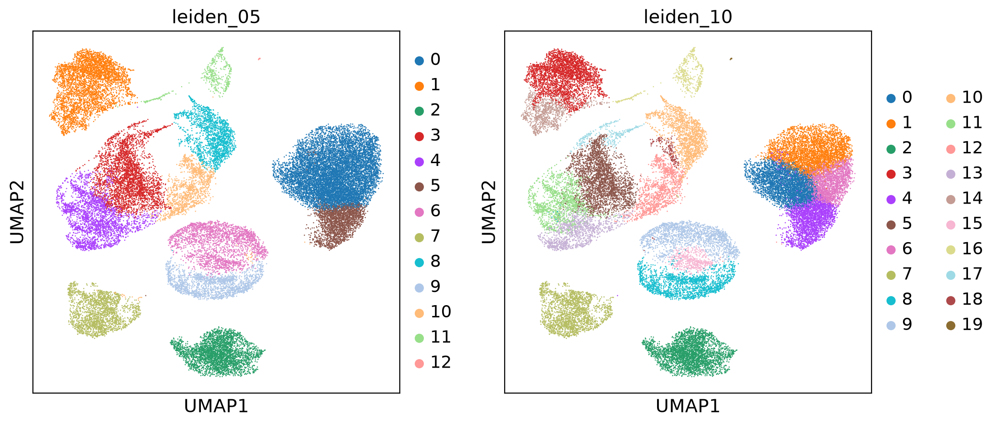

In [33]:
scl.us(adata, 'leiden_05,leiden_10')

In [34]:
sc.tl.rank_genes_groups(adata, groupby='leiden_05', method='wilcoxon', use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:24)


/home/lsj1022/anaconda3/envs/scenv/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/lsj1022/anaconda3/envs/scenv/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/lsj1022/anaconda3/envs/scenv/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/lsj1022/anaconda3/envs/scenv/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/lsj1022/anaconda3/envs/scenv/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[g

In [ ]:
adata.var_names = adata.var['gene_symbols'].copy()
adata.var_names_make_unique()

print(adata.var_names[:10])
print(adata.var_names.is_unique)

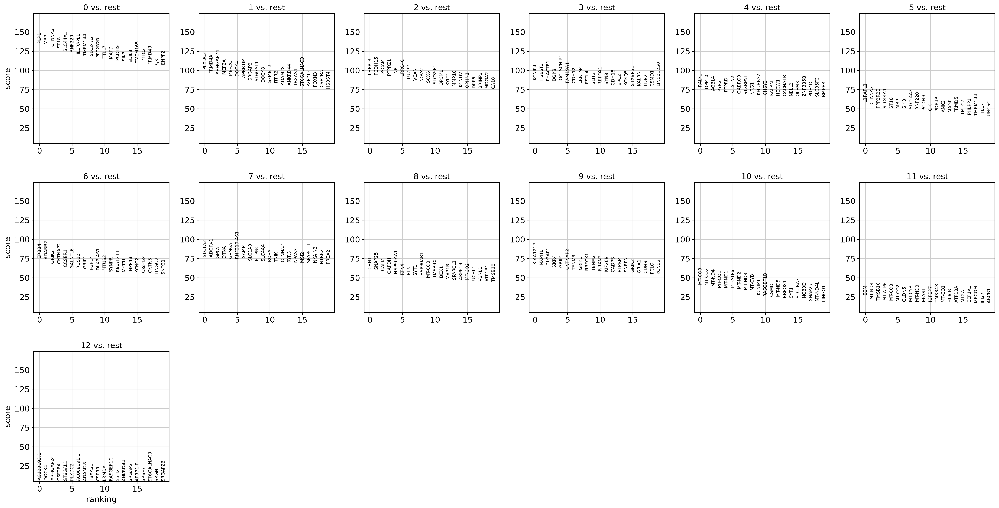

In [35]:
sc.pl.rank_genes_groups(adata, ncols = 6)

In [36]:
M = scl.markers.marker(adata,'leiden_05')
M.plot_marker()

AttributeError: 'numpy.ndarray' object has no attribute 'A1'

In [ ]:
adata.write(f"/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/{dataset}/{dataset}_qc.h5ad")

## if gene names are ensg

In [ ]:
raw = adata.raw.to_adata()

raw.var_names = raw.var['gene_symbols'].astype(str)
raw.var_names_make_unique()

adata.raw = raw

In [ ]:
adata.raw.var.index.name = "feature_id"
adata.var.index.name = "feature_id"

if adata.raw is not None:
    adata.raw.var.index.name = "feature_id"

In [ ]:
gene_to_id = dict(zip(odata.var["gene_symbols"], odata.var_names))

adata.var["source_gene_id"] = adata.var["gene_symbols"].map(gene_to_id)

print(adata.var[["gene_symbols", "source_gene_id"]].head())
print("Unmapped:", adata.var["source_gene_id"].isna().sum())

# 5. Lv.1 Annotation

In [37]:
markers_full = {
    "Microglia": [
        "P2RY12", "P2RY13", "TMEM119", "CX3CR1",
        "C1QA", "C1QB", "C1QC", "GPR34", "CSF1R"
    ],
    "Macrophage_MDM": [
        "FCGR3A", "LILRB1", "LILRB2", "CTSD",
        "CTSB", "LGALS3", "APOE", "SPP1"
    ],
    "Lymphocyte": [
        "CD3D", "CD3E", "TRBC1", "TRBC2",
        "SKAP1", "CD96", "CCL4", "NKG7"
    ],
    "Astrocyte": [
        "AQP4", "SLC1A2", "SLC1A3", "GFAP", "ALDH1L1"
    ],
    "Oligodendrocyte": [
        "PLP1", "MBP", "MOG", "MAG", "MOBP"
    ],
    "OPC": [
        "PDGFRA", "CSPG4", "VCAN", "OLIG1", "OLIG2"
    ],
    "Endothelial": [
        "CLDN5", "FLT1", "PECAM1", "VWF", "EMCN"
    ],
    "Pericyte": [
        "RGS5", "ABCC9", "PDGFRB", "CSPG4", "MCAM"
    ],
    "Neuron" : [
    'SNAP25', 'SYT1', 'RBFOX1',
    'STMN2', 'NEFL', 'NEFM',
    'MAP2', 'TUBB3',
    'GRIN1', 'DLG4'
    ],
}

gene_set = set(adata.var_names.dropna())

markers = {
    celltype: [gene for gene in genes if gene in gene_set]
    for celltype, genes in markers_full.items()
}

In [38]:
umap_markers = [
    # Microglia
    "P2RY12", "TMEM119", "C1QA",

    # Macrophage / MDM
    "FCGR3A", "LGALS3", "SPP1",

    # Lymphocyte
    "CD3D", "NKG7",

    # Astrocyte
    "AQP4", "SLC1A2",

    # Oligodendrocyte
    "MOG", "MOBP",

    # OPC
    "PDGFRA", "VCAN",

    # Endothelial
    "CLDN5", "VWF",

    # Pericyte
    "RGS5", "PDGFRB",

    # Neuron
    'SNAP25', 'SYT1', 'RBFOX1',
]

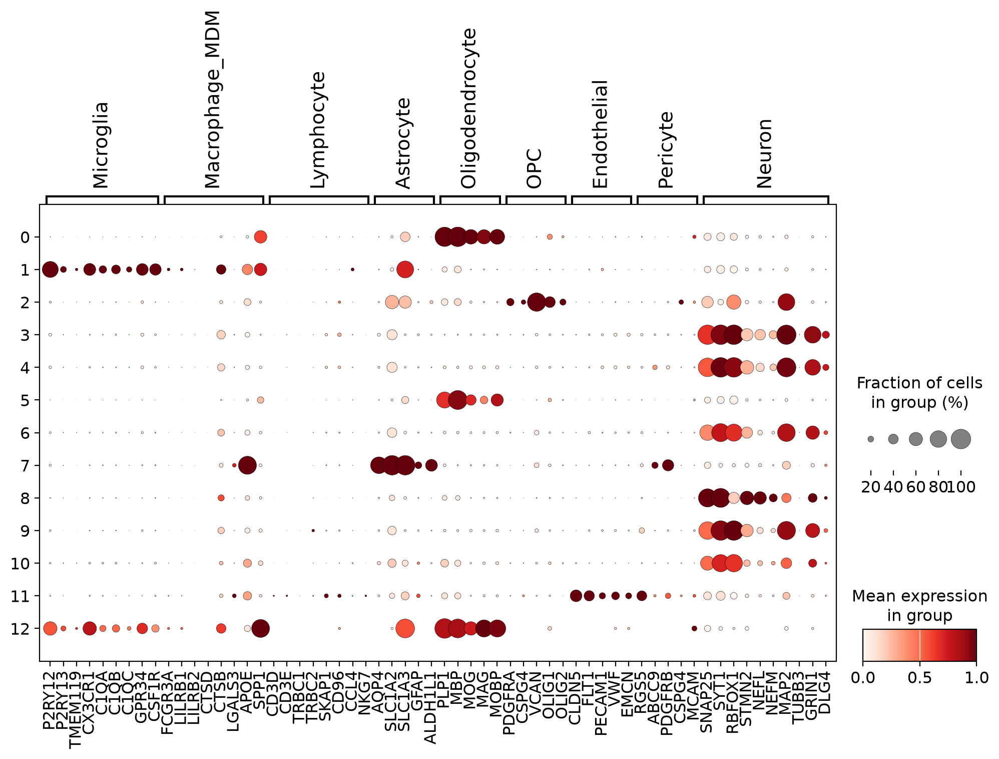

In [39]:
sc.pl.dotplot(
    adata,
    markers,
    groupby="leiden_05",
    standard_scale="var",
    dendrogram=False,
    figsize=(max(12, len(markers) * 0.35), 6),
)

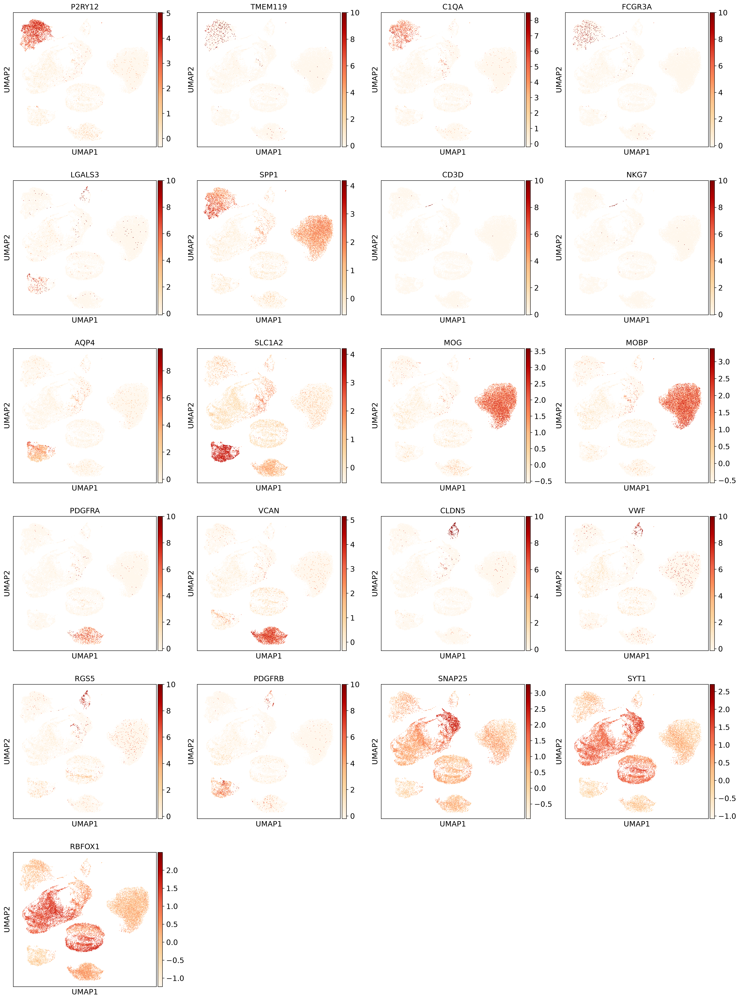

In [40]:
scl.us(adata, umap_markers)

In [41]:
lv1_map = {
    "0": "Oligodendrocyte",
    "1": "Microglia",
    "2": "OPC",
    "3": "Neuron",
    "4": "Neuron",
    "5": "Oligodendrocyte",
    "6": "Neuron",
    "7": "Astrocyte",
    "8": "Neuron",
    "9": "Neuron",
    "10": "Neuron",
    "11": "Endothelial",
    "12": "Doublet"
}

adata.obs["celltype_lv1"] = (
    adata.obs["leiden_05"]
    .astype(str)
    .map(lv1_map)
    .astype("category")
)

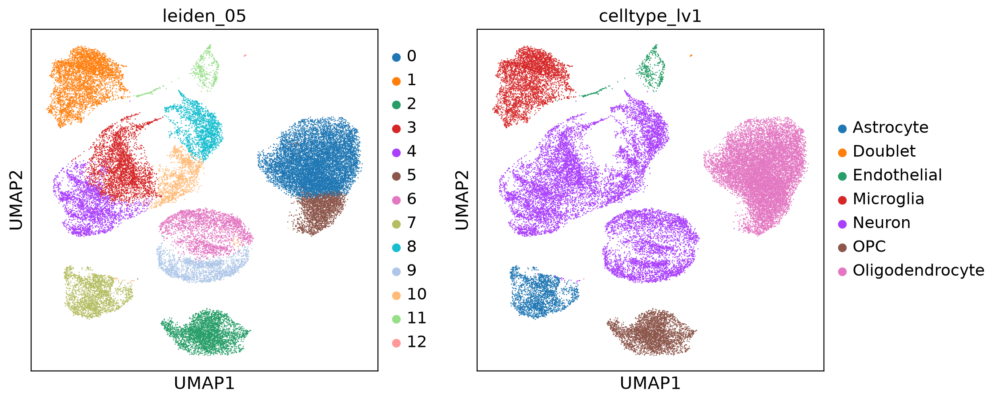

In [42]:
scl.us(adata, 'leiden_05,celltype_lv1')

In [43]:
adata.write(f"/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/{dataset}/{dataset}_qc.h5ad")

# 6. Microglia Lv. 2 annotation

In [3]:
adata = sc.read_h5ad(f"/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/{dataset}/{dataset}_qc.h5ad")

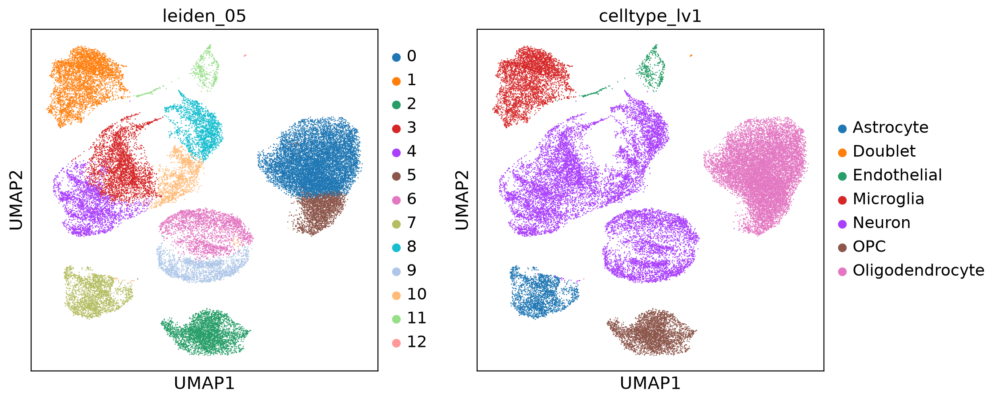

In [4]:
scl.us(adata, 'leiden_05,celltype_lv1')

In [5]:
print(adata)

mdata = adata[
    adata.obs["celltype_lv1"].isin(["Microglia"])
].copy()

AnnData object with n_obs × n_vars = 36088 × 29439
    obs: 'GSM', 'study_id', 'dataset_id', 'species', 'disease_status', 'diagnosis_raw', 'diagnosis_harmonized', 'fcd_class', 'fcd_subtype', 'mtoropathy_status', 'driver_mutation_status', 'driver_gene', 'driver_variant', 'mutation_scope', 'brain_region_raw', 'brain_region', 'lesion_position', 'control_type', 'epilepsy_duration_years', 'sample_source', 'tissue_state', 'cell_or_nucleus', 'platform', 'chemistry', 'raw_counts_available', 'cell_metadata_available', 'genetic_metadata_available', 'processed_file_format', 'geo_downloadable', 'source_url', 'sample_id', 'donor_id', 'donor_id_global', 'age_years', 'sex', 'main_analysis_eligible', 'exclusion_reason', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb'

In [6]:
mdata

AnnData object with n_obs × n_vars = 4046 × 29439
    obs: 'GSM', 'study_id', 'dataset_id', 'species', 'disease_status', 'diagnosis_raw', 'diagnosis_harmonized', 'fcd_class', 'fcd_subtype', 'mtoropathy_status', 'driver_mutation_status', 'driver_gene', 'driver_variant', 'mutation_scope', 'brain_region_raw', 'brain_region', 'lesion_position', 'control_type', 'epilepsy_duration_years', 'sample_source', 'tissue_state', 'cell_or_nucleus', 'platform', 'chemistry', 'raw_counts_available', 'cell_metadata_available', 'genetic_metadata_available', 'processed_file_format', 'geo_downloadable', 'source_url', 'sample_id', 'donor_id', 'donor_id_global', 'age_years', 'sex', 'main_analysis_eligible', 'exclusion_reason', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb',

In [7]:
mdata.X = mdata.layers['counts'].copy()
print(mdata.X.max(), mdata.X.min())

827.0 0.0


In [8]:
# preprocess
sc.pp.normalize_total(mdata)
sc.pp.log1p(mdata)
sc.pp.highly_variable_genes(mdata)
sc.pp.scale(mdata)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


computing PCA
    with n_comps=50
    finished (0:00:00)


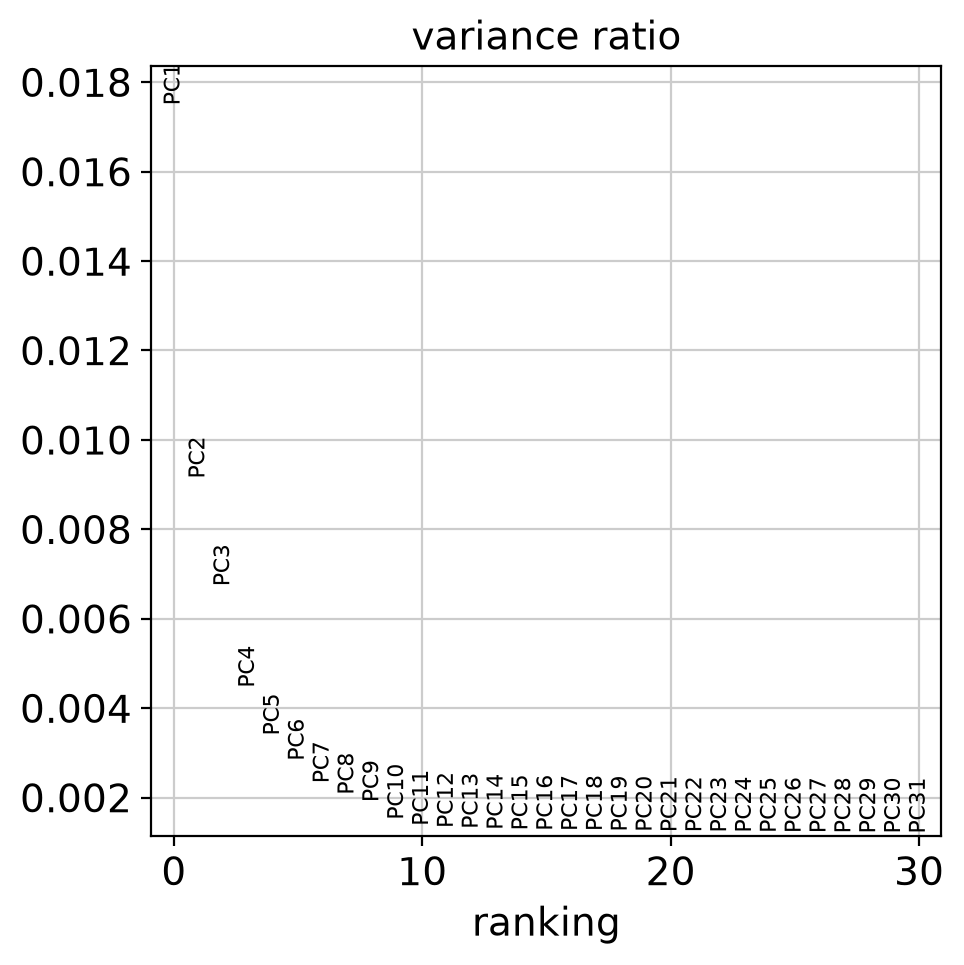

In [9]:
# feature selection
sc.tl.pca(mdata)
sc.pl.pca_variance_ratio(mdata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:05)


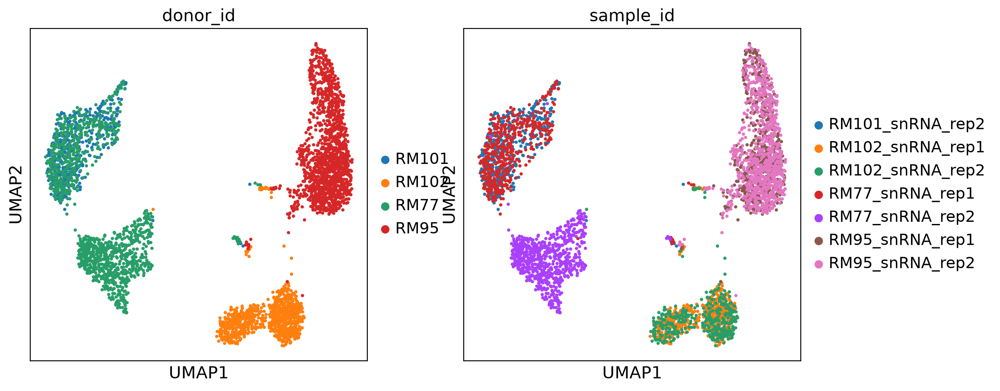

In [10]:
sc.pp.neighbors(mdata, use_rep = 'X_pca', n_pcs=20)
sc.tl.umap(mdata)
scl.us(mdata, 'donor_id,sample_id')

In [11]:
mdata.obs.drop(columns=["leiden_05", "leiden_10"], inplace=True)
mdata.uns.pop("cdm_leiden_05", None)
for key in ["leiden_05", "leiden_10", "leiden_05_colors", "leiden_10_colors"]:
    mdata.uns.pop(key, None)

In [12]:
mdata

AnnData object with n_obs × n_vars = 4046 × 29439
    obs: 'GSM', 'study_id', 'dataset_id', 'species', 'disease_status', 'diagnosis_raw', 'diagnosis_harmonized', 'fcd_class', 'fcd_subtype', 'mtoropathy_status', 'driver_mutation_status', 'driver_gene', 'driver_variant', 'mutation_scope', 'brain_region_raw', 'brain_region', 'lesion_position', 'control_type', 'epilepsy_duration_years', 'sample_source', 'tissue_state', 'cell_or_nucleus', 'platform', 'chemistry', 'raw_counts_available', 'cell_metadata_available', 'genetic_metadata_available', 'processed_file_format', 'geo_downloadable', 'source_url', 'sample_id', 'donor_id', 'donor_id_global', 'age_years', 'sex', 'main_analysis_eligible', 'exclusion_reason', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb',

In [13]:
mdata.write(f"/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/{dataset}/{dataset}_mg.h5ad")